In [31]:
import numpy as np
from scipy import signal
from scipy.io import wavfile
import IPython.display as ipd
import matplotlib.pyplot as plt

def lowpass_fir(sample_rate, x):
    nyq_freq = sample_rate * 0.5
    transition_width = 1e2 / nyq_freq
    
    stop_attenuate_db = 60.0
    N, beta = signal.kaiserord(stop_attenuate_db, transition_width)
    cutoff_freq = 1e3
    taps = signal.firwin(N, cutoff_freq/nyq_freq, window=("kaiser", beta))
    return signal.lfilter(taps, 1.0, x)

# load data
sample_rate, data = wavfile.read("lick.wav")

# convert to mono
data = data.sum(axis=1) / 2
filtered = lowpass_fir(sample_rate, data)
ipd.Audio(filtered, rate=sample_rate)

In [29]:
ipd.Audio(data, rate=sample_rate)

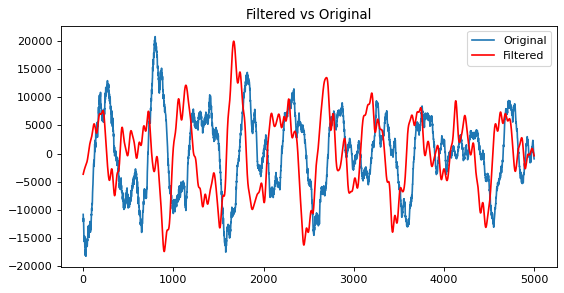

In [30]:
plt.figure(figsize=(8, 4), dpi=80)
plt.plot(data[240000:245000])
plt.plot(filtered[240000:245000], "r-")
plt.legend(["Original", "Filtered"])
plt.title("Filtered vs Original")
plt.savefig("comparison.png")
plt.show()